<a href="https://colab.research.google.com/github/dieineb/Bracis23/blob/main/CNN_Vis_Layers.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Layers Visualization

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
import tensorflow as tf
import keras as ke
import numpy as np
import matplotlib.pyplot as plt
import os, shutil, pathlib
from tensorflow import keras
from tensorflow.keras import layers

In [ ]:

model = tf.keras.models.load_model('/content/gdrive/MyDrive/Bracis/cnnBT_with_dataAug') # architecture and weights model saved with data Aug

print("TensorFlow version:", tf.__version__)
print("Eager mode: ", tf.executing_eagerly())
print("GPU is", "available" if tf.config.list_physical_devices('GPU') else "NOT AVAILABLE")
model.summary()

TensorFlow version: 2.12.0
Eager mode:  True
GPU is available
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 180, 180, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 180, 180, 3)       0         
                                                                 
 rescaling (Rescaling)       (None, 180, 180, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 178, 178, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 89, 89, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 87, 87, 64)        18496     

# Brain tumor images from the internet. They are not part of BD Br35H.

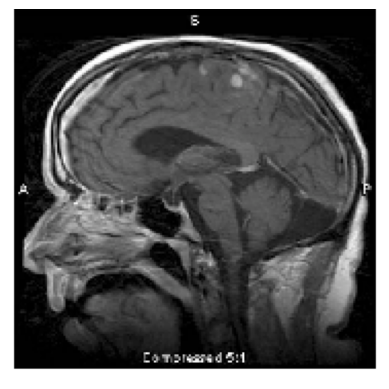

In [ ]:
from tensorflow import keras
import numpy as np

img_path = ("/content/gdrive/MyDrive/Bracis/088BT.png")

def get_img_array(img_path, target_size):
    img = keras.utils.load_img(
        img_path, target_size=target_size)
    array = keras.utils.img_to_array(img)
    array = np.expand_dims(array, axis=0)
    return array

img_tensor = get_img_array(img_path, target_size=(180, 180))

import matplotlib.pyplot as plt
plt.axis("off")
plt.imshow(img_tensor[0].astype("uint8"))
plt.show()

In [ ]:
from tensorflow.keras import layers

layer_outputs = []
layer_names = []
for layer in model.layers:
    if isinstance(layer, (layers.Conv2D, layers.MaxPooling2D)):
        layer_outputs.append(layer.output)
        layer_names.append(layer.name)
activation_model = keras.Model(inputs=model.input, outputs=layer_outputs)

activations = activation_model.predict(img_tensor)

1/1 [==============================] - 0s 93ms/step


(1, 178, 178, 32)


(-0.5, 177.5, 177.5, -0.5)

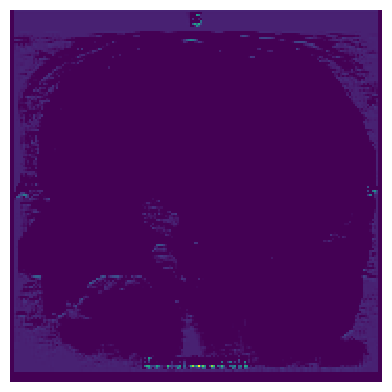

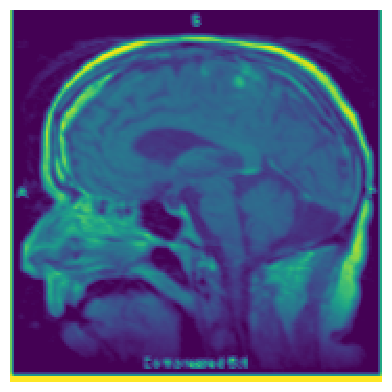

In [ ]:
first_layer_activation = activations[0]
print(first_layer_activation.shape)

plt.matshow(first_layer_activation[0, :, :, 2], cmap="viridis") #First layer, first channel
plt.axis("off")

plt.matshow(first_layer_activation[0, :, :, 30], cmap="viridis") #First layer, 22th channel
plt.axis("off")

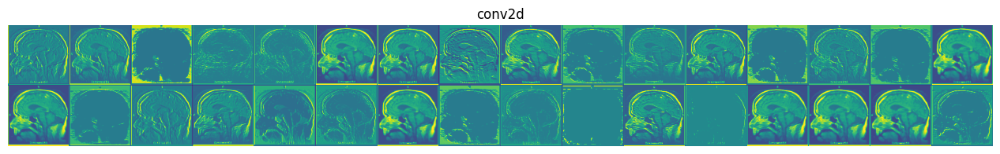

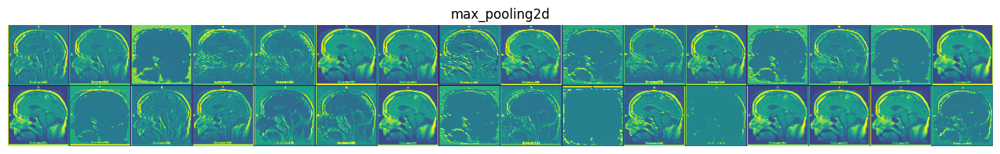

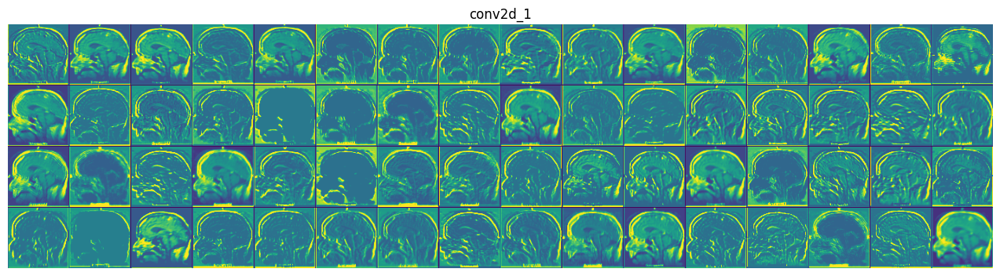

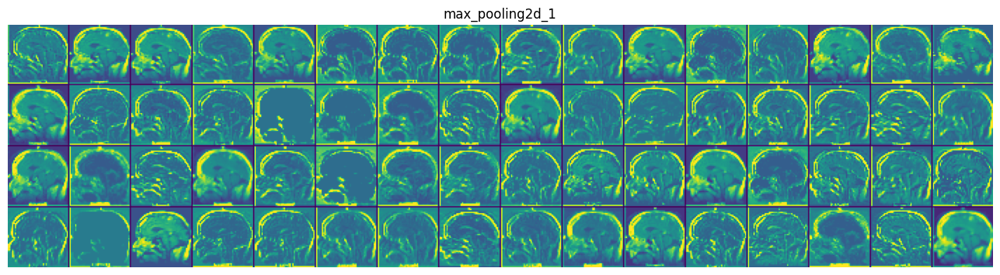

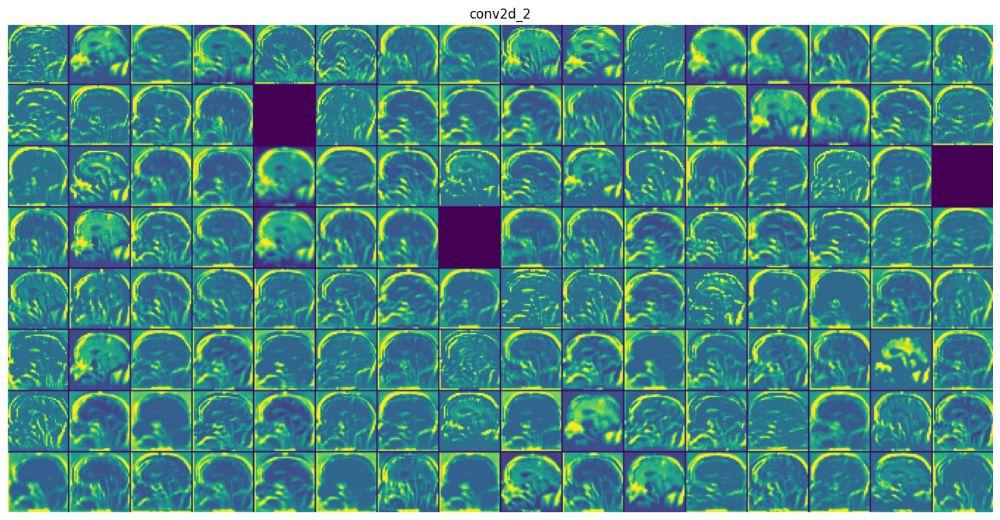

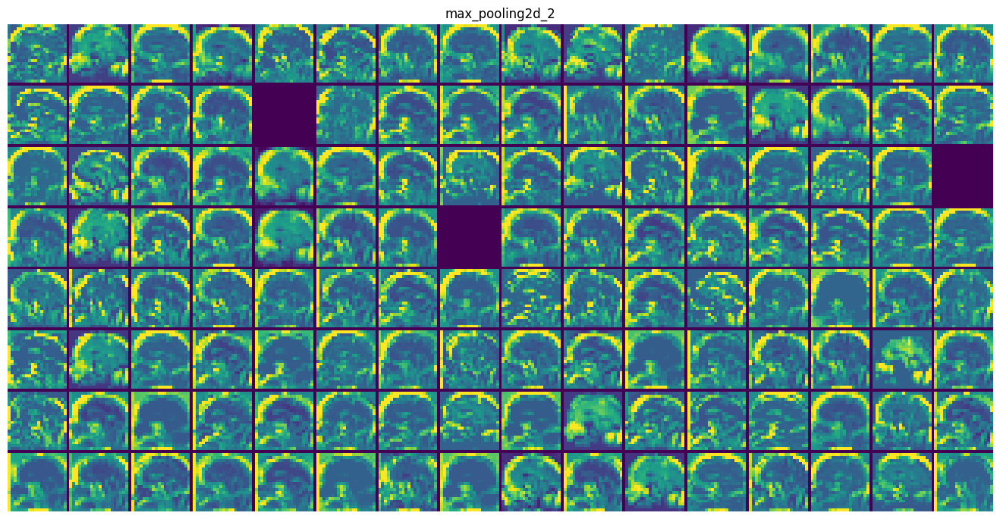

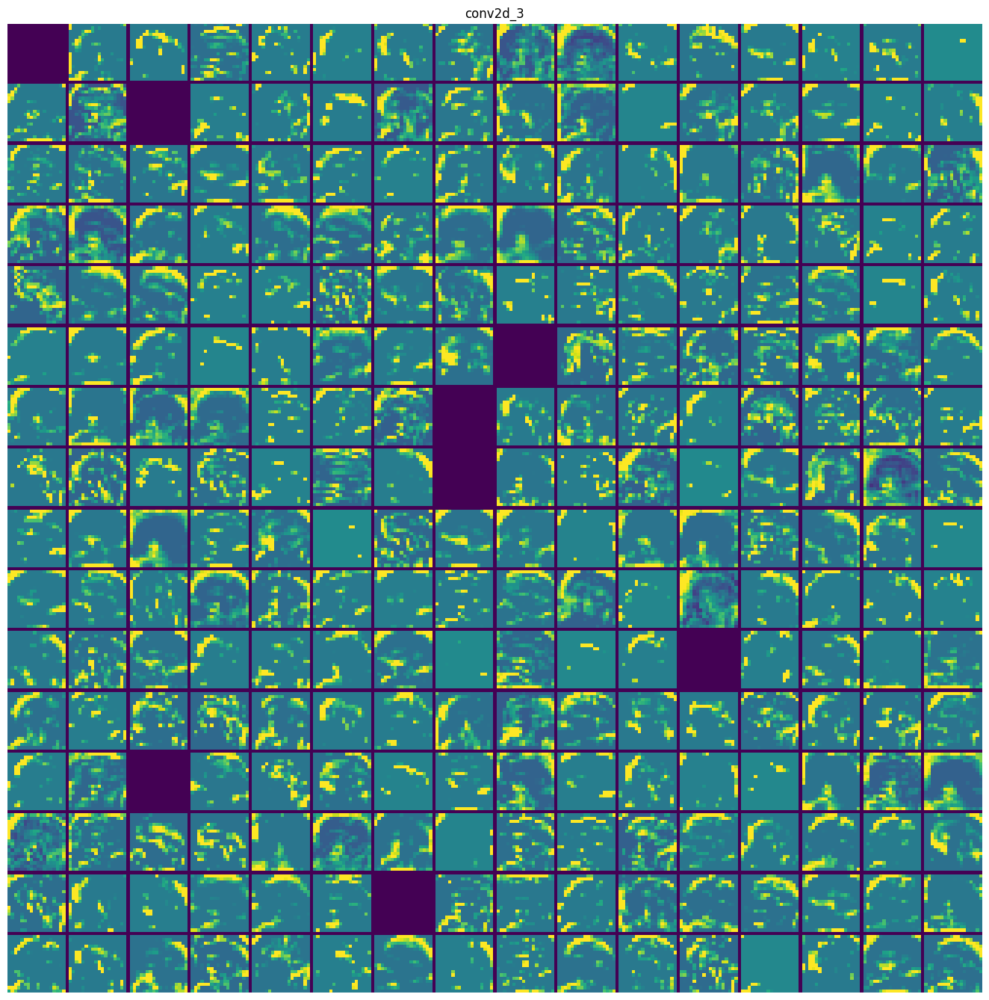

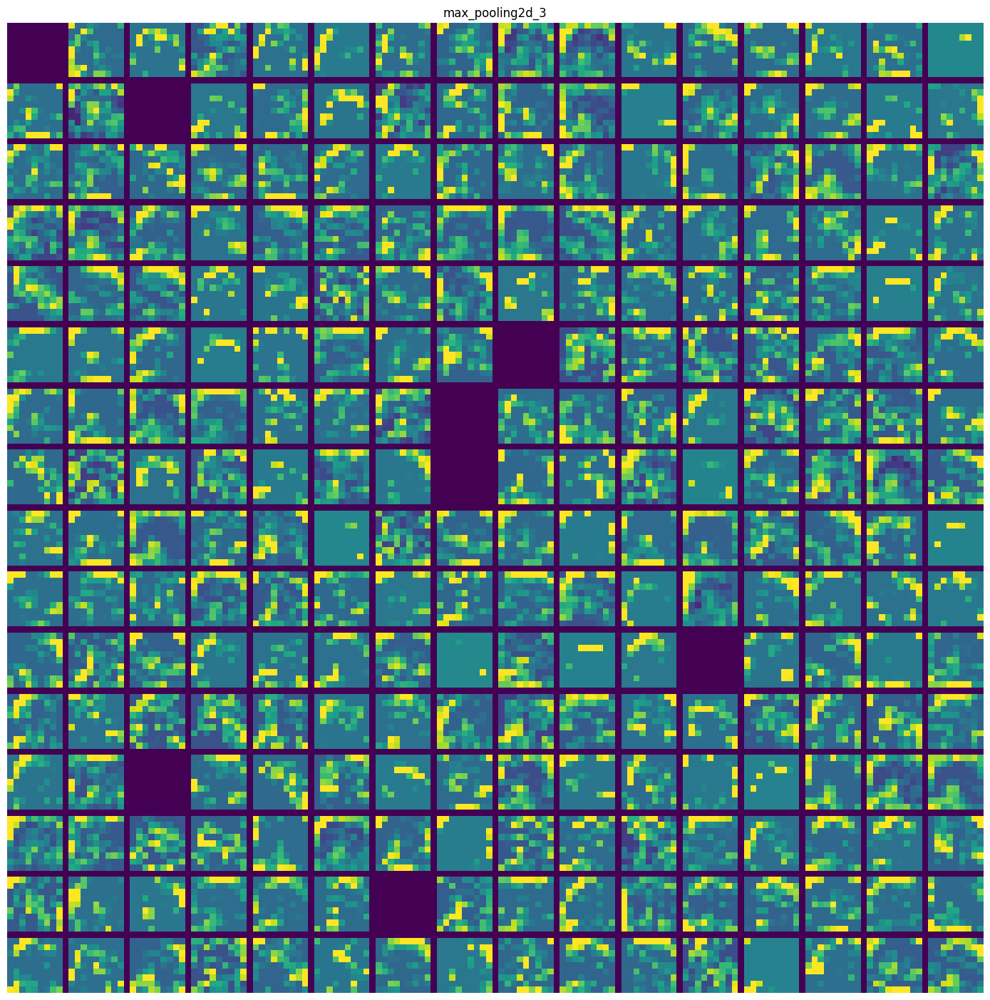

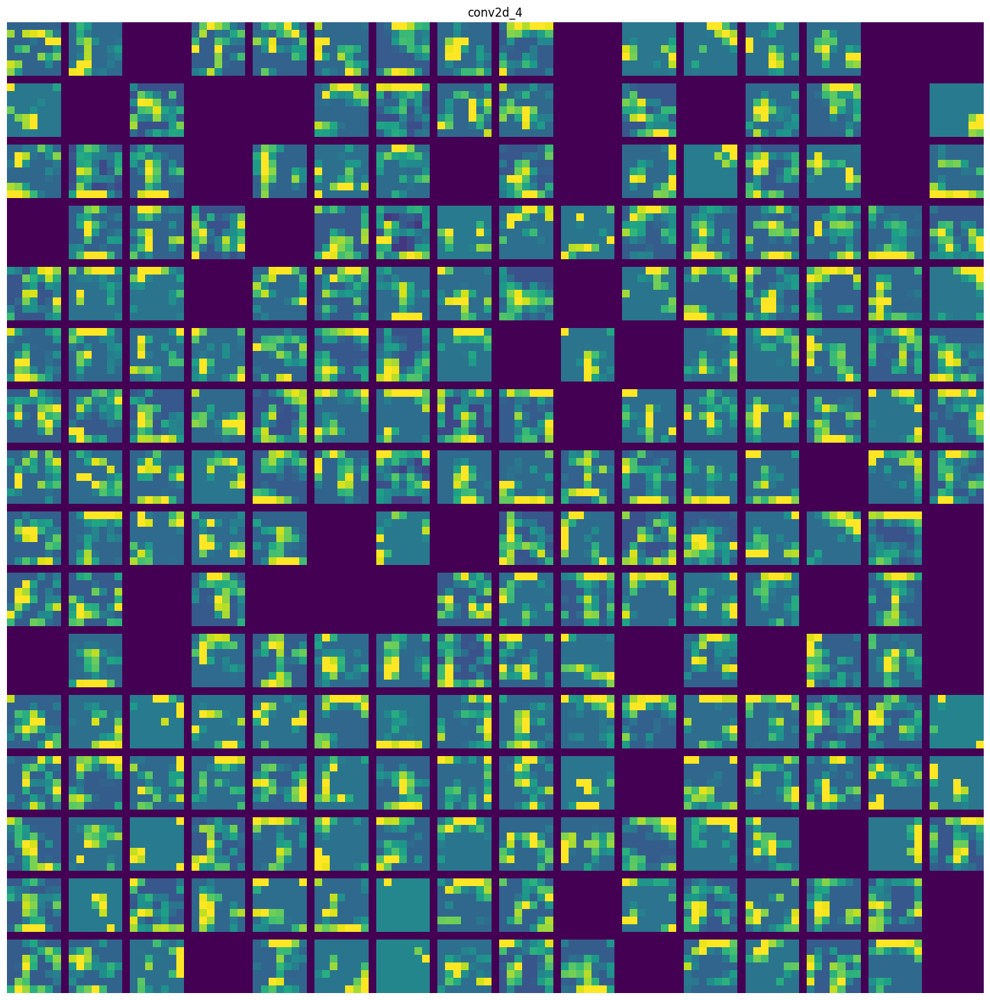

In [ ]:
images_per_row = 16
for layer_name, layer_activation in zip(layer_names, activations):
    n_features = layer_activation.shape[-1]
    size = layer_activation.shape[1]
    n_cols = n_features // images_per_row
    display_grid = np.zeros(((size + 1) * n_cols - 1,
                             images_per_row * (size + 1) - 1))
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_index = col * images_per_row + row
            channel_image = layer_activation[0, :, :, channel_index].copy()
            if channel_image.sum() != 0:
                channel_image -= channel_image.mean()
                channel_image /= channel_image.std()
                channel_image *= 64
                channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype("uint8")
            display_grid[
                col * (size + 1): (col + 1) * size + col,
                row * (size + 1) : (row + 1) * size + row] = channel_image
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.axis("off")
    plt.imshow(display_grid, aspect="auto", cmap="viridis")

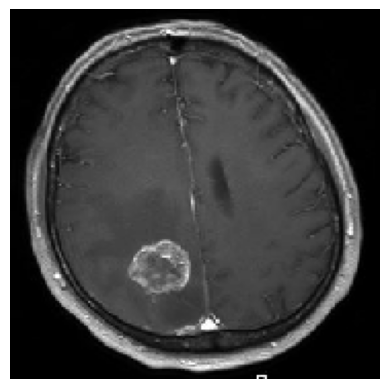

In [ ]:
from tensorflow import keras
import numpy as np

img_path = ("/content/gdrive/MyDrive/Bracis/y1494.jpg")

def get_img_array(img_path, target_size):
    img = keras.utils.load_img(
        img_path, target_size=target_size)
    array = keras.utils.img_to_array(img)
    array = np.expand_dims(array, axis=0)
    return array

img_tensor = get_img_array(img_path, target_size=(180, 180))

import matplotlib.pyplot as plt
plt.axis("off")
plt.imshow(img_tensor[0].astype("uint8"))
plt.show()

In [ ]:
from tensorflow.keras import layers

layer_outputs = []
layer_names = []
for layer in model.layers:
    if isinstance(layer, (layers.Conv2D, layers.MaxPooling2D)):
        layer_outputs.append(layer.output)
        layer_names.append(layer.name)
activation_model = keras.Model(inputs=model.input, outputs=layer_outputs)

activations = activation_model.predict(img_tensor)

1/1 [==============================] - 6s 6s/step


(1, 178, 178, 32)


(-0.5, 177.5, 177.5, -0.5)

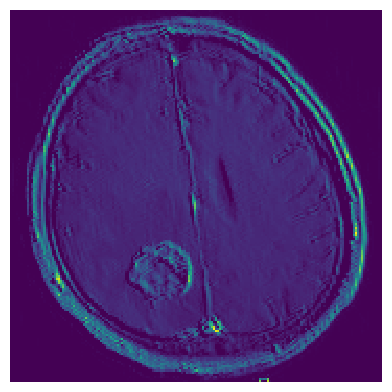

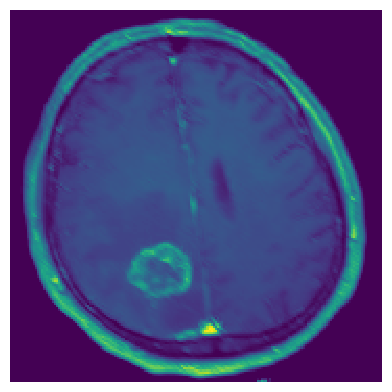

In [ ]:
first_layer_activation = activations[0]
print(first_layer_activation.shape)

plt.matshow(first_layer_activation[0, :, :, 1], cmap="viridis") #First layer, first channel
plt.axis("off")

plt.matshow(first_layer_activation[0, :, :, 22], cmap="viridis") #First layer, 22th channel
plt.axis("off")

(1, 89, 89, 32)


(-0.5, 88.5, 88.5, -0.5)

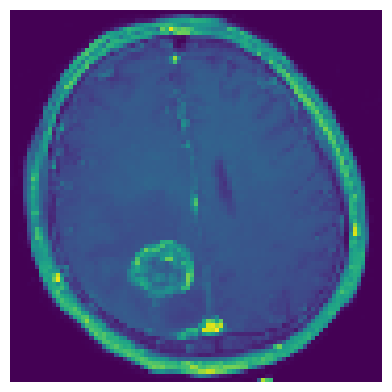

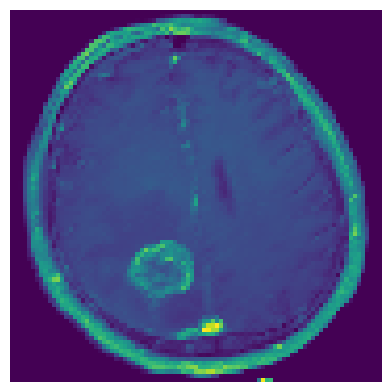

In [ ]:
second_layer_activation = activations[1]
print(second_layer_activation.shape)

plt.matshow(second_layer_activation[0, :, :, 5], cmap="viridis") #Second layer, 4th channel
plt.axis("off")

plt.matshow(second_layer_activation[0, :, :, 28], cmap="viridis") #Second layer, 28th channel
plt.axis("off")

(1, 87, 87, 64)


(-0.5, 86.5, 86.5, -0.5)

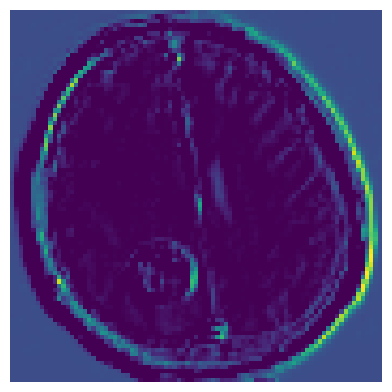

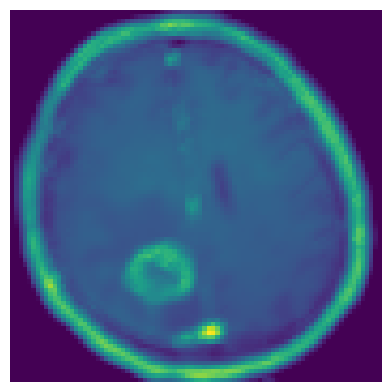

In [ ]:
third_layer_activation = activations[2]
print(third_layer_activation.shape)

plt.matshow(third_layer_activation[0, :, :, 12], cmap="viridis") #Third layer, 12th channel
plt.axis("off")

plt.matshow(third_layer_activation[0, :, :, 63], cmap="viridis") #Third layer, 63 channel
plt.axis("off")

(1, 43, 43, 64)


(-0.5, 42.5, 42.5, -0.5)

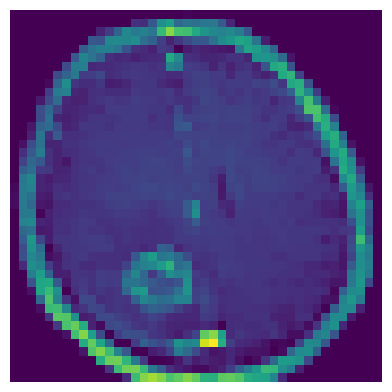

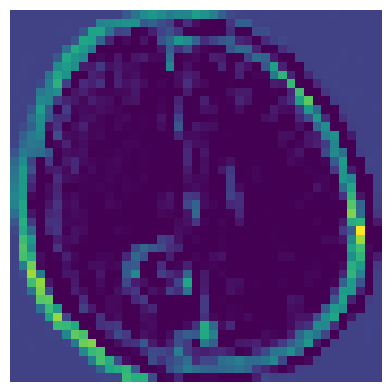

In [ ]:
fourth_layer_activation = activations[3]
print(fourth_layer_activation.shape)

plt.matshow(fourth_layer_activation[0, :, :, 2], cmap="viridis") #Third layer, 12th channel
plt.axis("off")

plt.matshow(fourth_layer_activation[0, :, :, 6], cmap="viridis") #Third layer, 63 channel
plt.axis("off")

(1, 41, 41, 128)


(-0.5, 40.5, 40.5, -0.5)

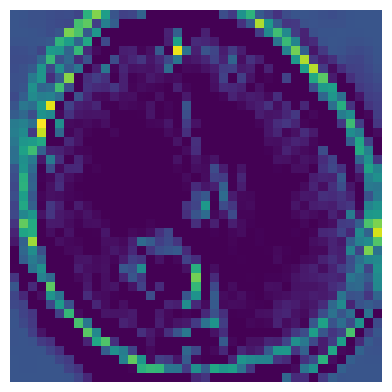

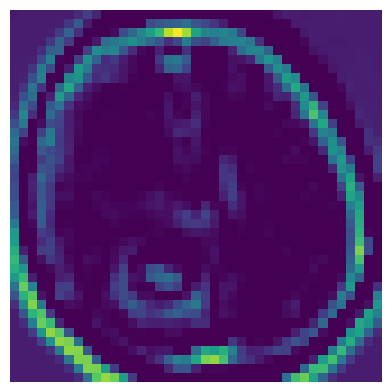

In [ ]:
fifth_layer_activation = activations[4]
print(fifth_layer_activation.shape)

plt.matshow(fifth_layer_activation[0, :, :, 4], cmap="viridis") #fifth layer, 4th channel
plt.axis("off")

plt.matshow(fifth_layer_activation[0, :, :, 50], cmap="viridis") #fifth layer, 50th channel
plt.axis("off")


(1, 20, 20, 128)


(-0.5, 19.5, 19.5, -0.5)

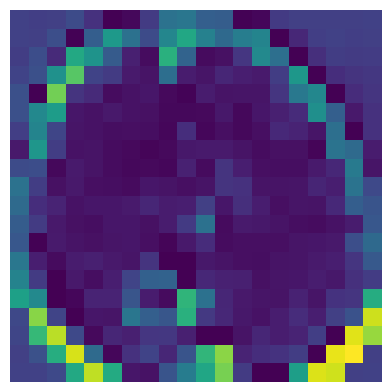

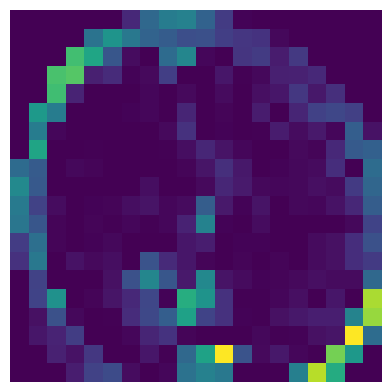

In [ ]:
sixth_layer_activation = activations[5]
print(sixth_layer_activation.shape)

plt.matshow(sixth_layer_activation[0, :, :, 5], cmap="viridis") #sixth layer, 5th channel
plt.axis("off")

plt.matshow(sixth_layer_activation[0, :, :, 45], cmap="viridis") #sixth layer, 45th channel
plt.axis("off")

(1, 20, 20, 128)


(-0.5, 19.5, 19.5, -0.5)

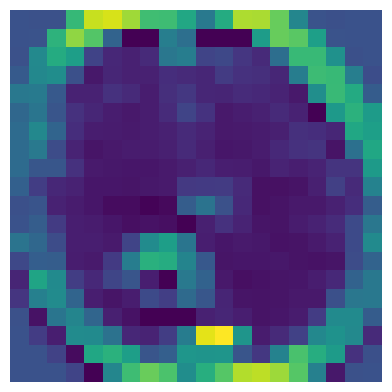

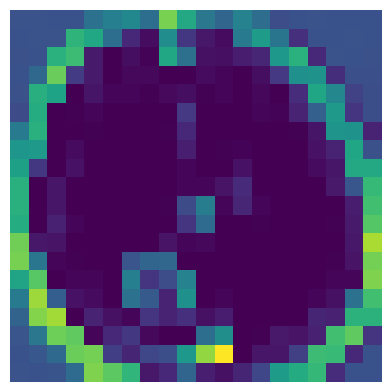

In [ ]:
seventh_layer_activation = activations[5]
print(seventh_layer_activation.shape)

plt.matshow(seventh_layer_activation[0, :, :, 2], cmap="viridis") #seventh layer, 2nd channel
plt.axis("off")

plt.matshow(seventh_layer_activation[0, :, :, 15], cmap="viridis") #seventh layer, 15 channel
plt.axis("off")

(1, 20, 20, 128)


(-0.5, 19.5, 19.5, -0.5)

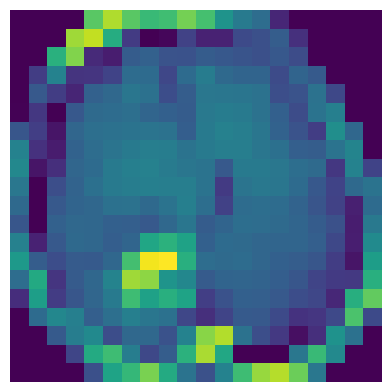

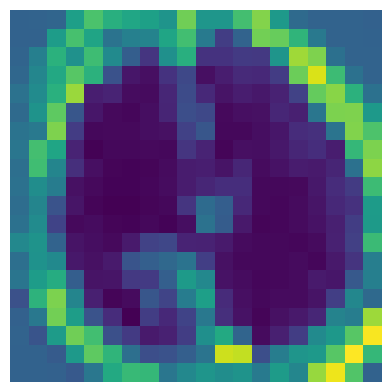

In [ ]:
eighth_layer_activation = activations[5]
print(eighth_layer_activation.shape)

plt.matshow(eighth_layer_activation[0, :, :, 1], cmap="viridis") #sixth layer, first channel
plt.axis("off")

plt.matshow(eighth_layer_activation[0, :, :, 115], cmap="viridis") #sixth layer, 115th channel
plt.axis("off")

(1, 7, 7, 256)


(-0.5, 6.5, 6.5, -0.5)

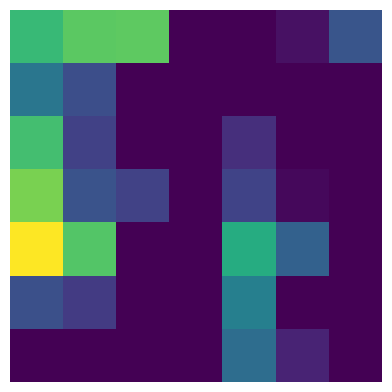

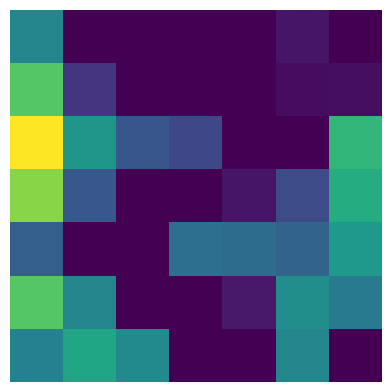

In [ ]:
ninth_layer_activation = activations[8]
print(ninth_layer_activation.shape)

plt.matshow(ninth_layer_activation[0, :, :, 1], cmap="viridis") #Ninth layer, 1th channel
plt.axis("off")

plt.matshow(ninth_layer_activation[0, :, :, 5], cmap="viridis") #Ninth layer, 5 channel
plt.axis("off")

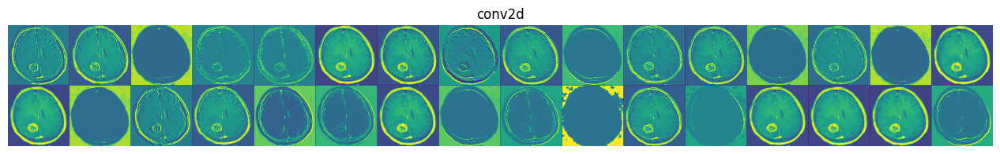

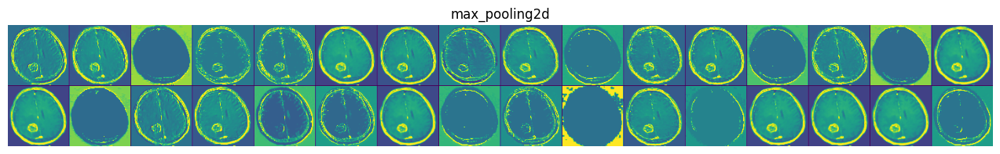

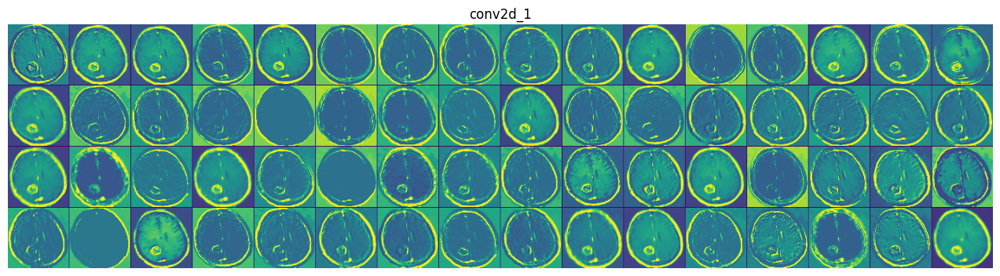

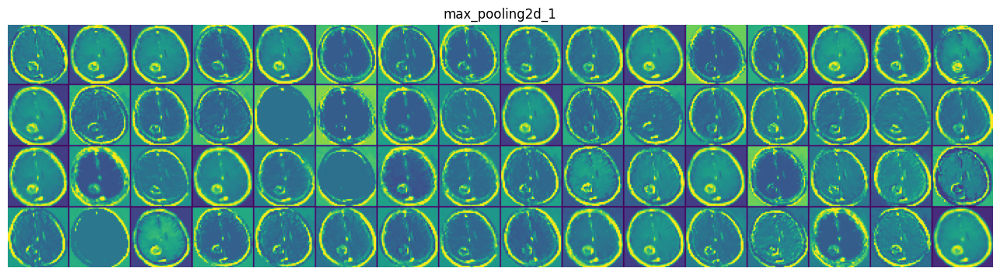

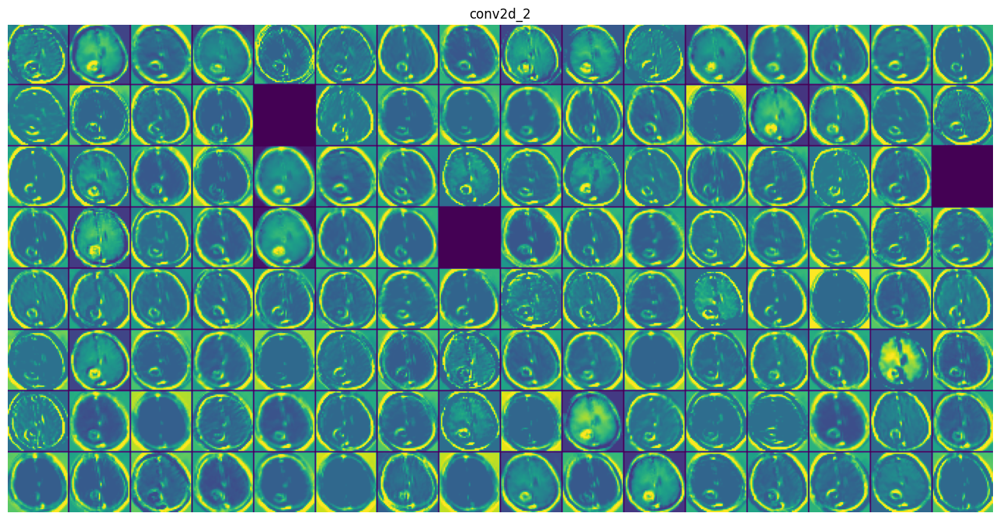

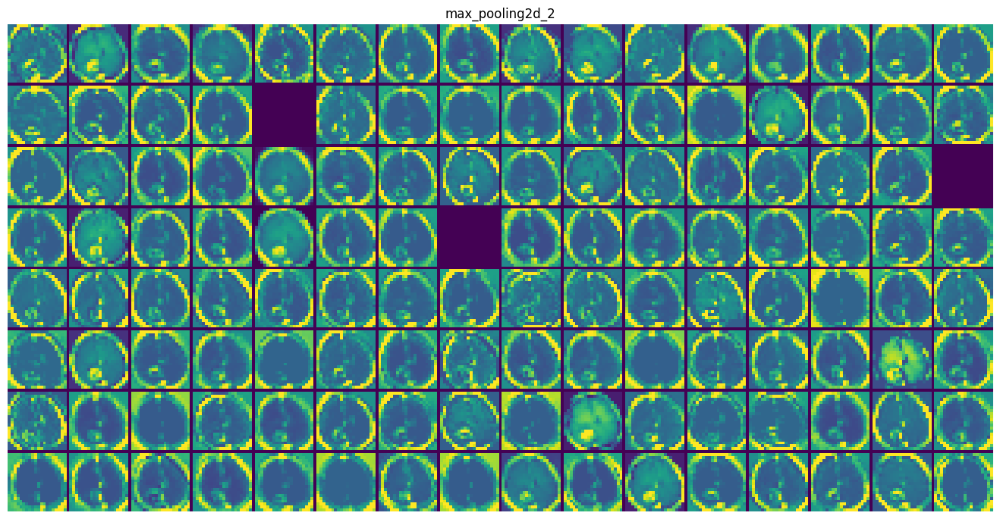

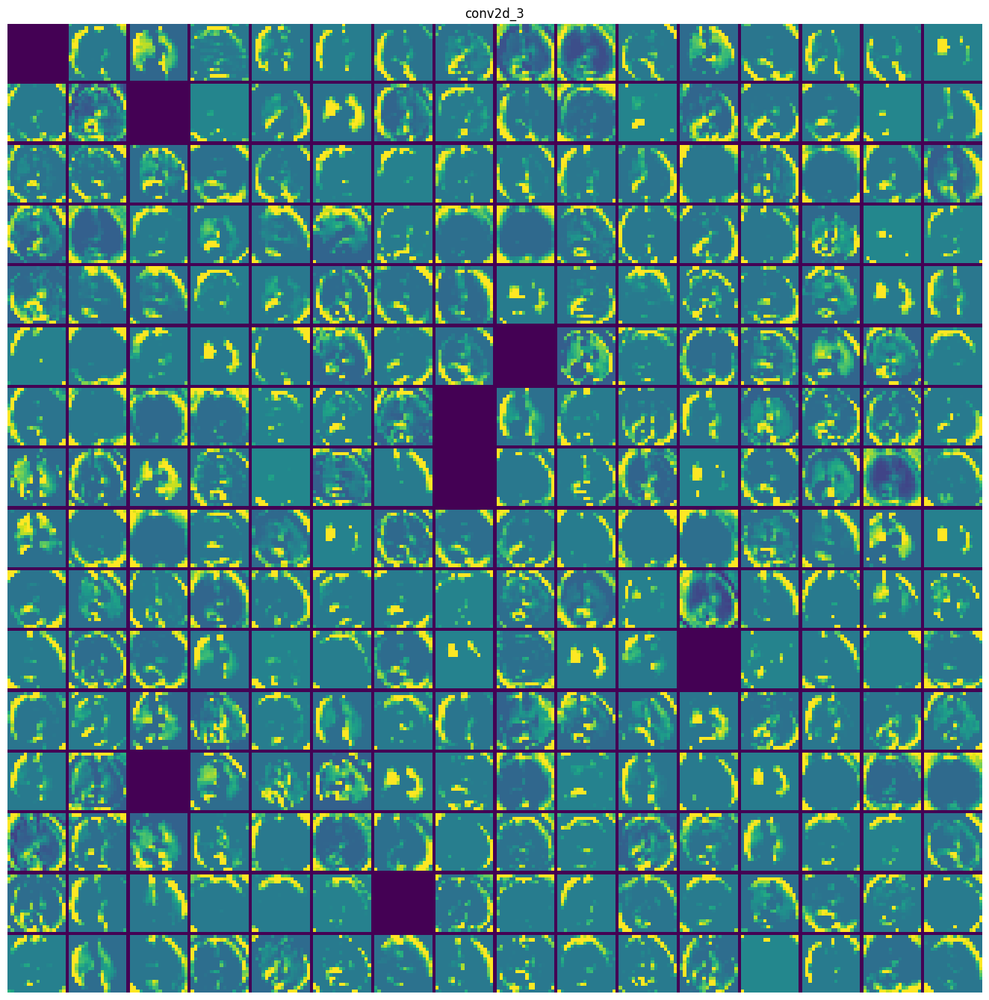

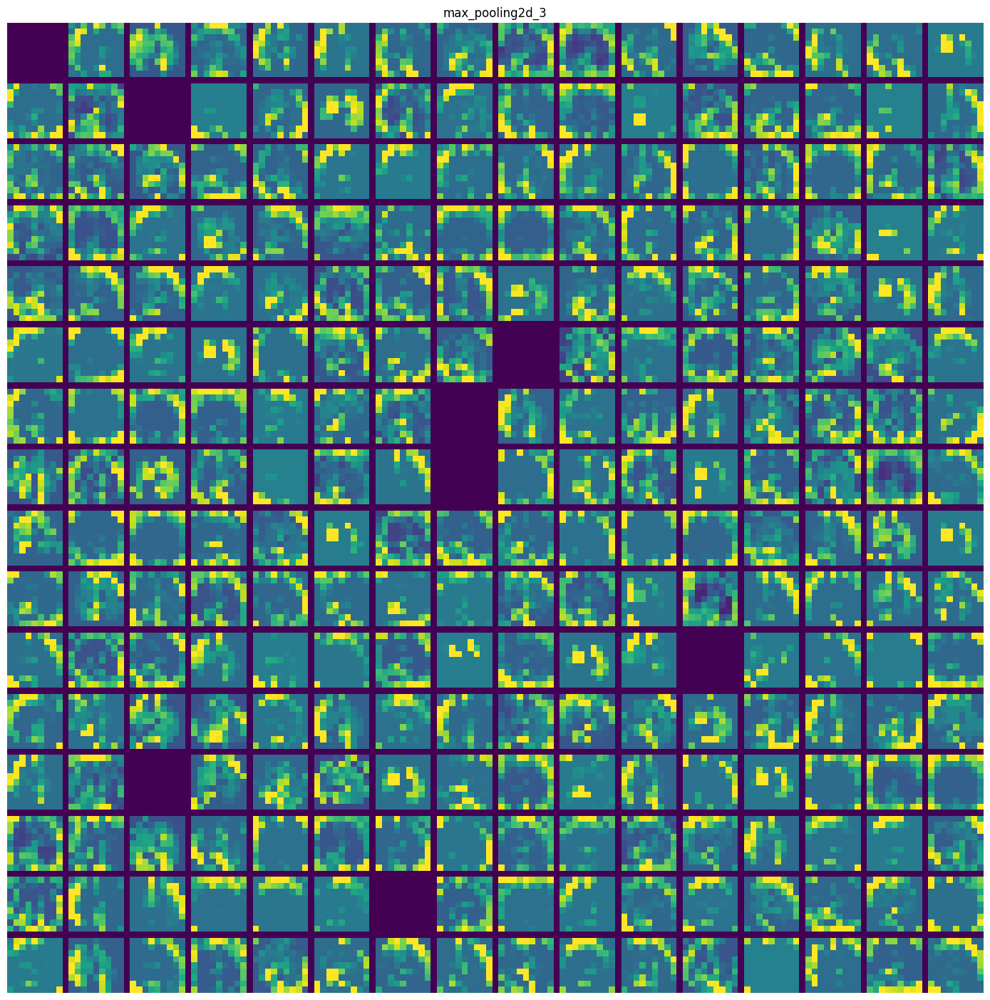

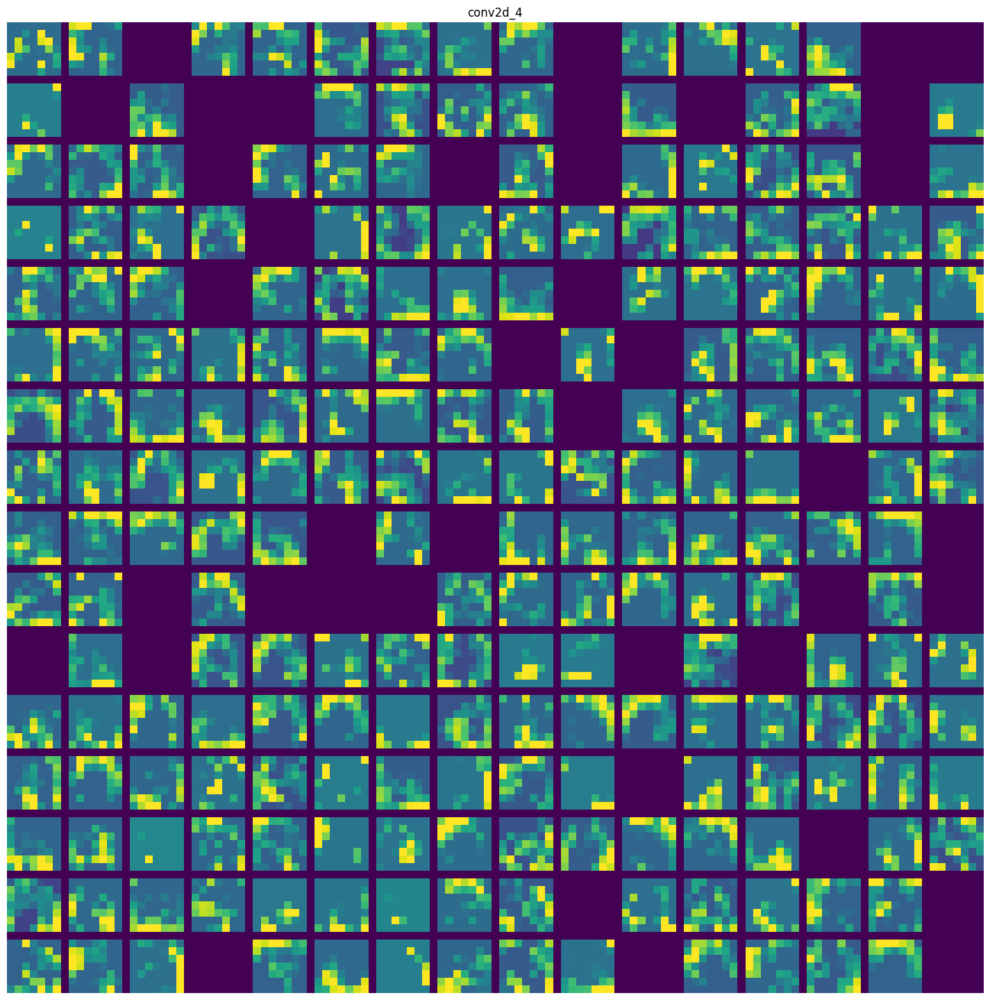

In [ ]:
images_per_row = 16
for layer_name, layer_activation in zip(layer_names, activations):
    n_features = layer_activation.shape[-1]
    size = layer_activation.shape[1]
    n_cols = n_features // images_per_row
    display_grid = np.zeros(((size + 1) * n_cols - 1,
                             images_per_row * (size + 1) - 1))
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_index = col * images_per_row + row
            channel_image = layer_activation[0, :, :, channel_index].copy()
            if channel_image.sum() != 0:
                channel_image -= channel_image.mean()
                channel_image /= channel_image.std()
                channel_image *= 64
                channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype("uint8")
            display_grid[
                col * (size + 1): (col + 1) * size + col,
                row * (size + 1) : (row + 1) * size + row] = channel_image
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.axis("off")
    plt.imshow(display_grid, aspect="auto", cmap="viridis")

## Second image (Brain Tumor)

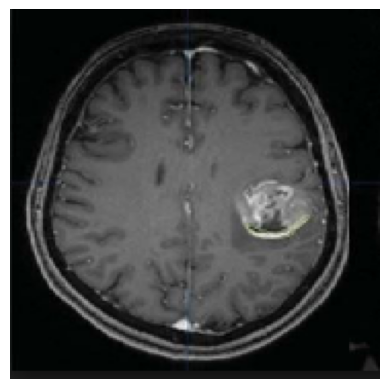

In [ ]:
img_path = ("/content/gdrive/MyDrive/Bracis/y1465.jpg")

def get_img_array(img_path, target_size):
    img = keras.utils.load_img(
        img_path, target_size=target_size)
    array = keras.utils.img_to_array(img)
    array = np.expand_dims(array, axis=0)
    return array

img_tensor = get_img_array(img_path, target_size=(180, 180))

import matplotlib.pyplot as plt
plt.axis("off")
plt.imshow(img_tensor[0].astype("uint8"))
plt.show()

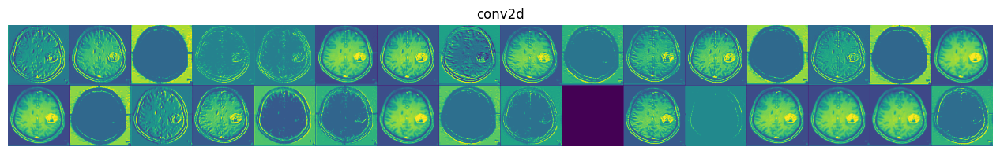

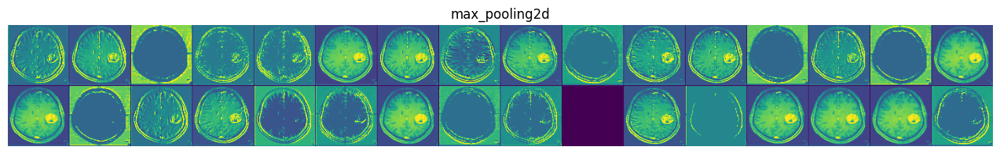

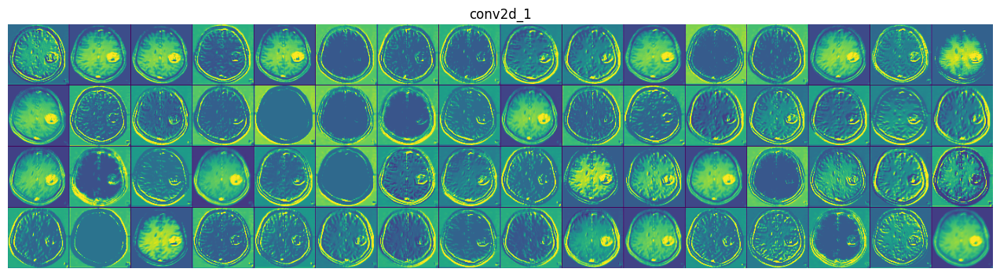

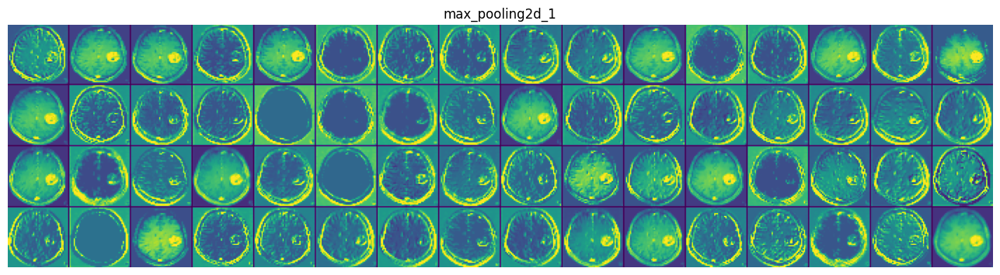

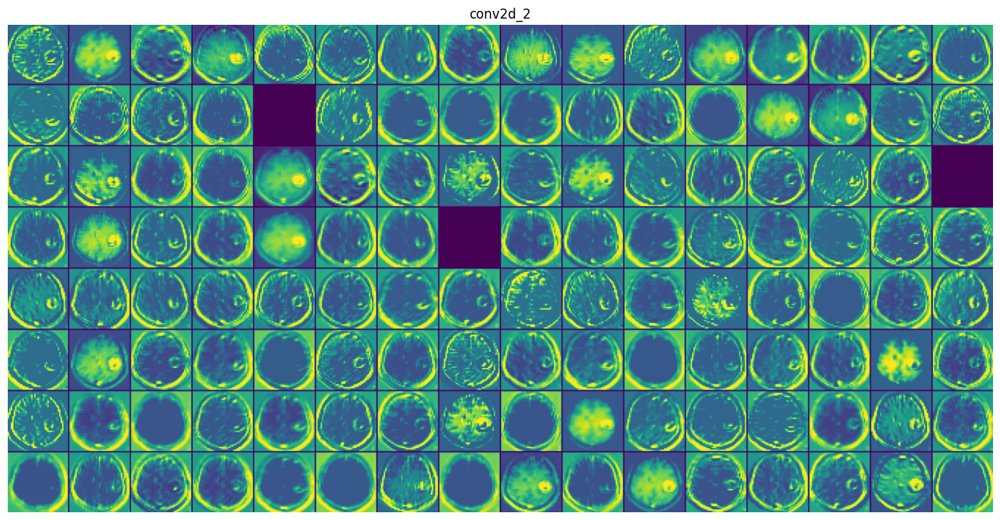

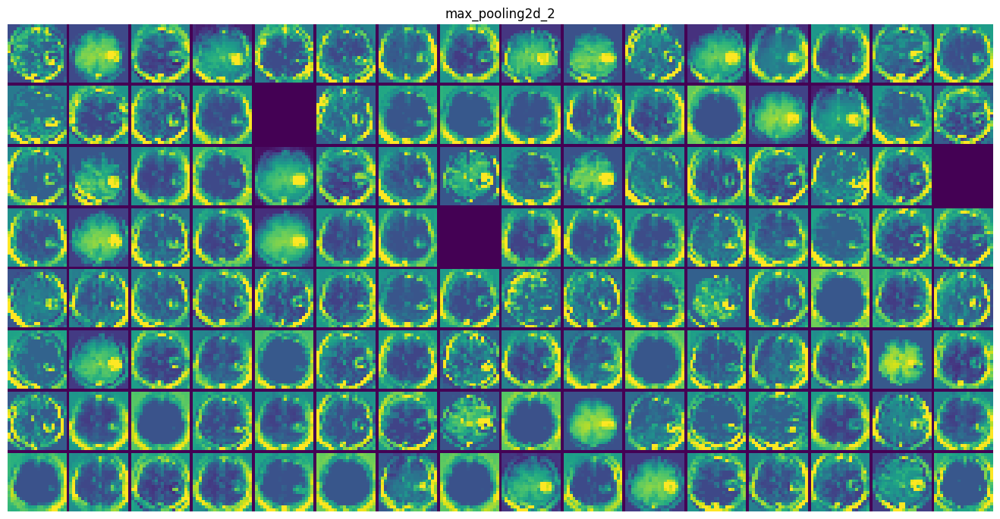

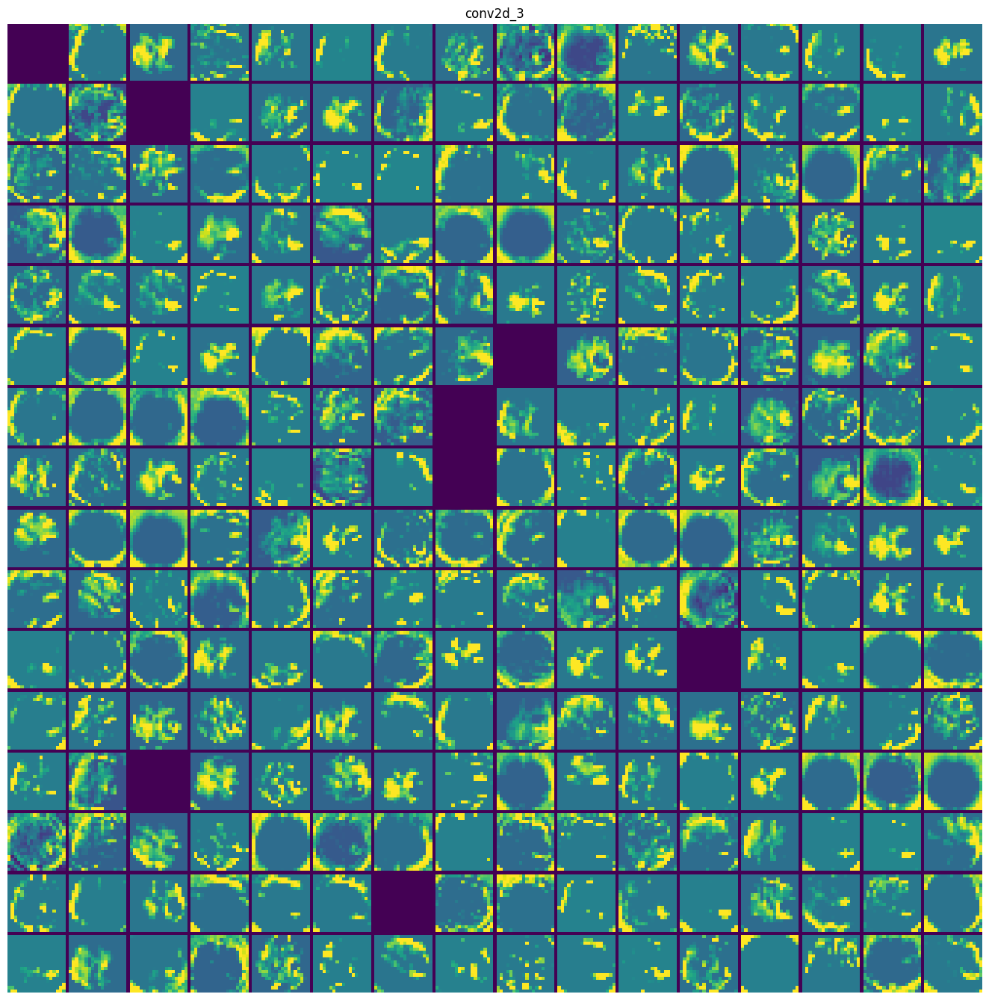

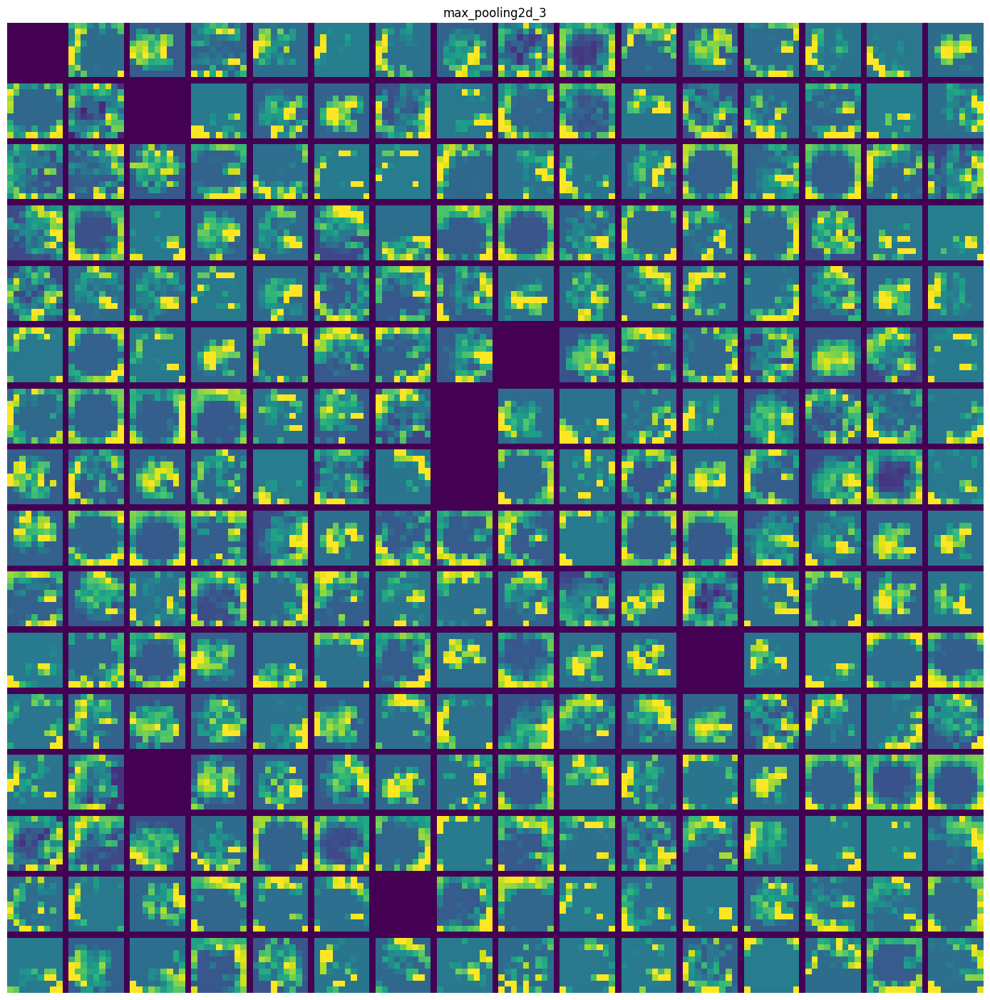

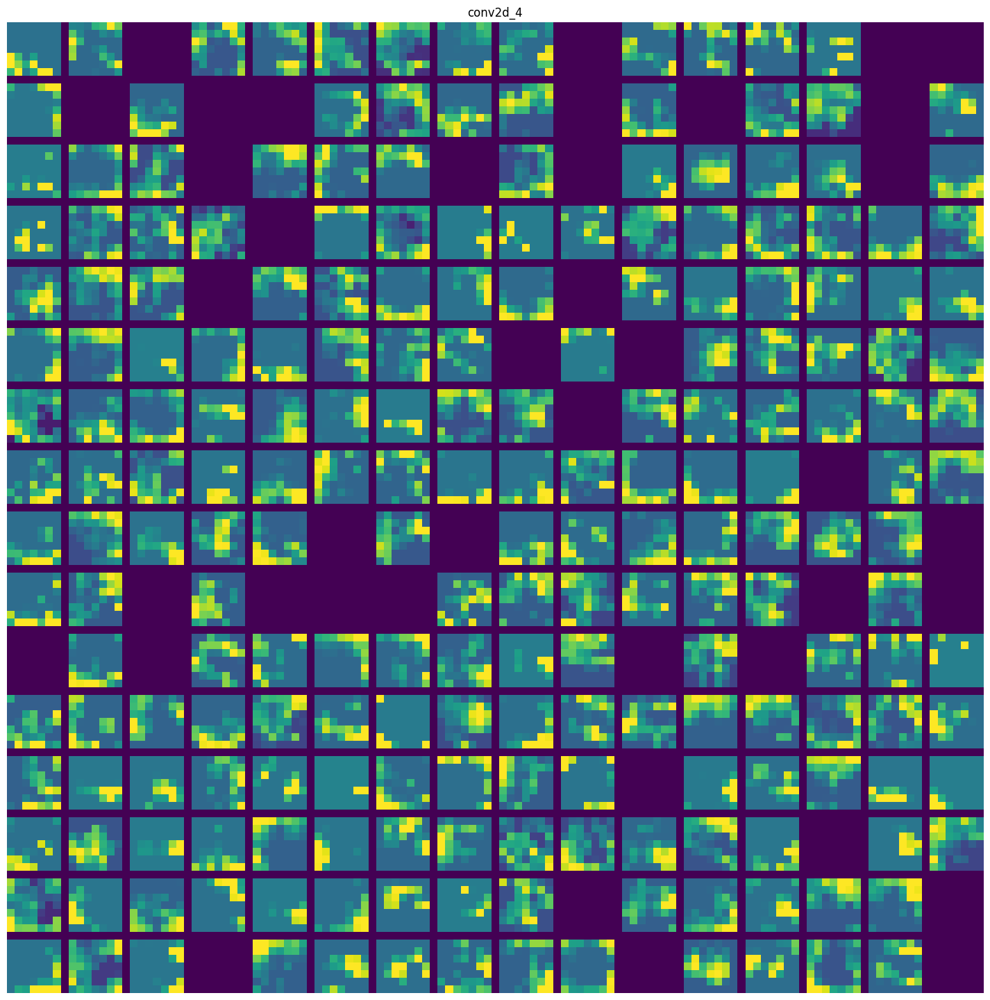

In [ ]:
images_per_row = 16
for layer_name, layer_activation in zip(layer_names, activations):
    n_features = layer_activation.shape[-1]
    size = layer_activation.shape[1]
    n_cols = n_features // images_per_row
    display_grid = np.zeros(((size + 1) * n_cols - 1,
                             images_per_row * (size + 1) - 1))
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_index = col * images_per_row + row
            channel_image = layer_activation[0, :, :, channel_index].copy()
            if channel_image.sum() != 0:
                channel_image -= channel_image.mean()
                channel_image /= channel_image.std()
                channel_image *= 64
                channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype("uint8")
            display_grid[
                col * (size + 1): (col + 1) * size + col,
                row * (size + 1) : (row + 1) * size + row] = channel_image
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.axis("off")
    plt.imshow(display_grid, aspect="auto", cmap="viridis")

# Normal Image

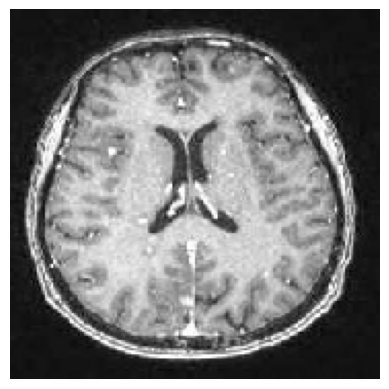

In [ ]:
img_path = ("/content/gdrive/MyDrive/Bracis/no1432.jpg")

def get_img_array(img_path, target_size):
    img = keras.utils.load_img(
        img_path, target_size=target_size)
    array = keras.utils.img_to_array(img)
    array = np.expand_dims(array, axis=0)
    return array

img_tensor = get_img_array(img_path, target_size=(180, 180))

import matplotlib.pyplot as plt
plt.axis("off")
plt.imshow(img_tensor[0].astype("uint8"))
plt.show()

(1, 87, 87, 64)


(-0.5, 86.5, 86.5, -0.5)

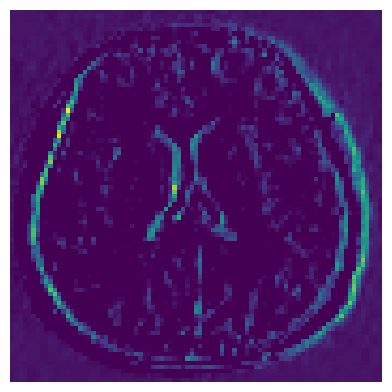

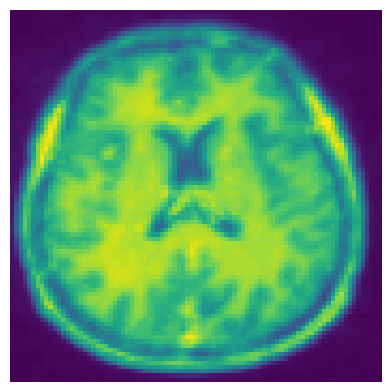

In [ ]:
third_layer_activation = activations[2]
print(third_layer_activation.shape)

plt.matshow(third_layer_activation[0, :, :, 12], cmap="viridis") #Third layer, 12th channel
plt.axis("off")

plt.matshow(third_layer_activation[0, :, :, 63], cmap="viridis") #Third layer, 63 channel
plt.axis("off")

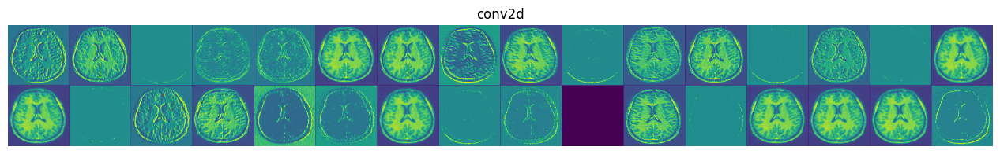

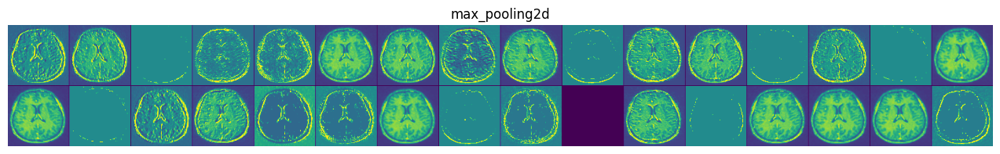

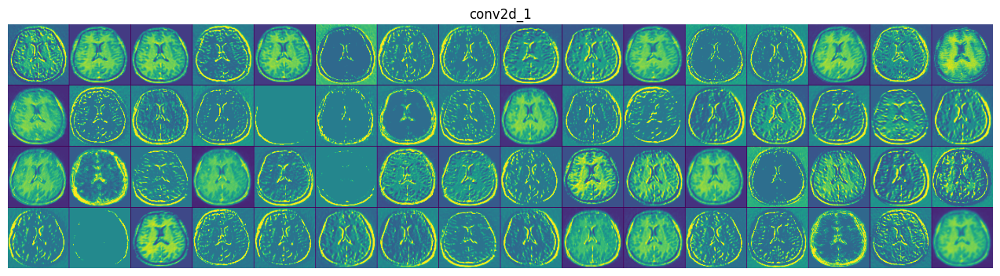

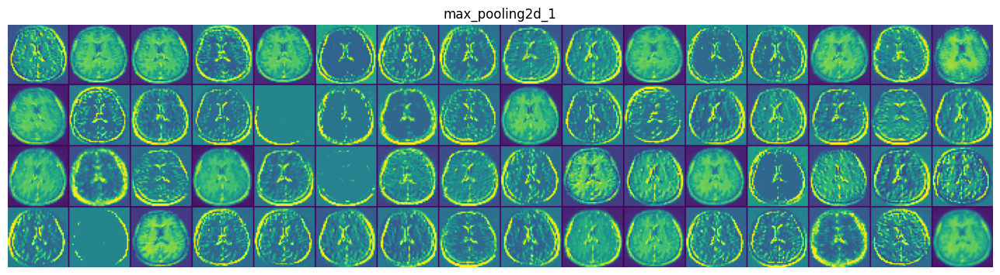

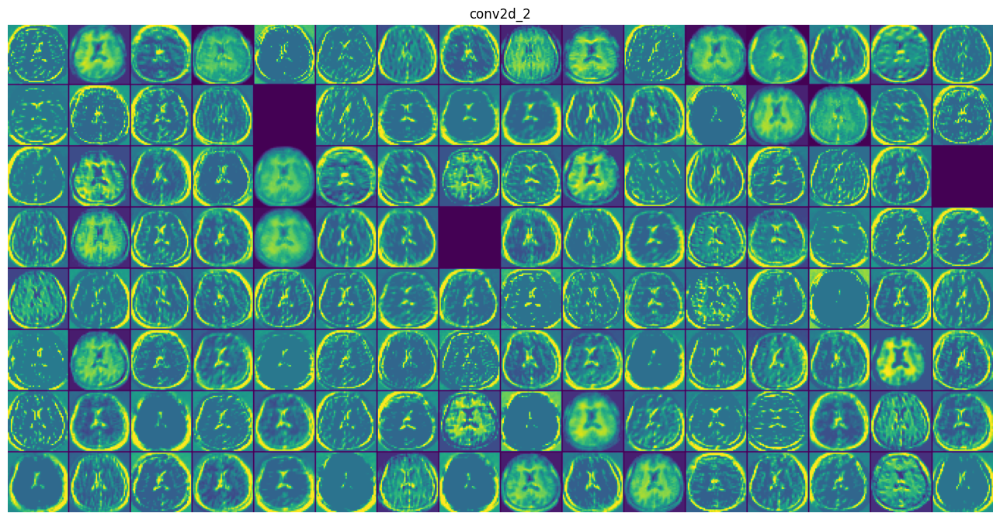

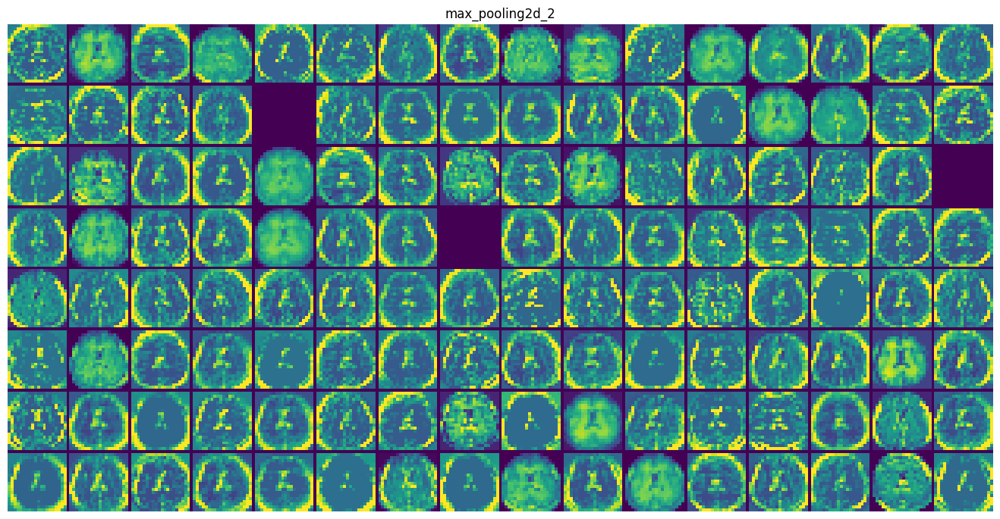

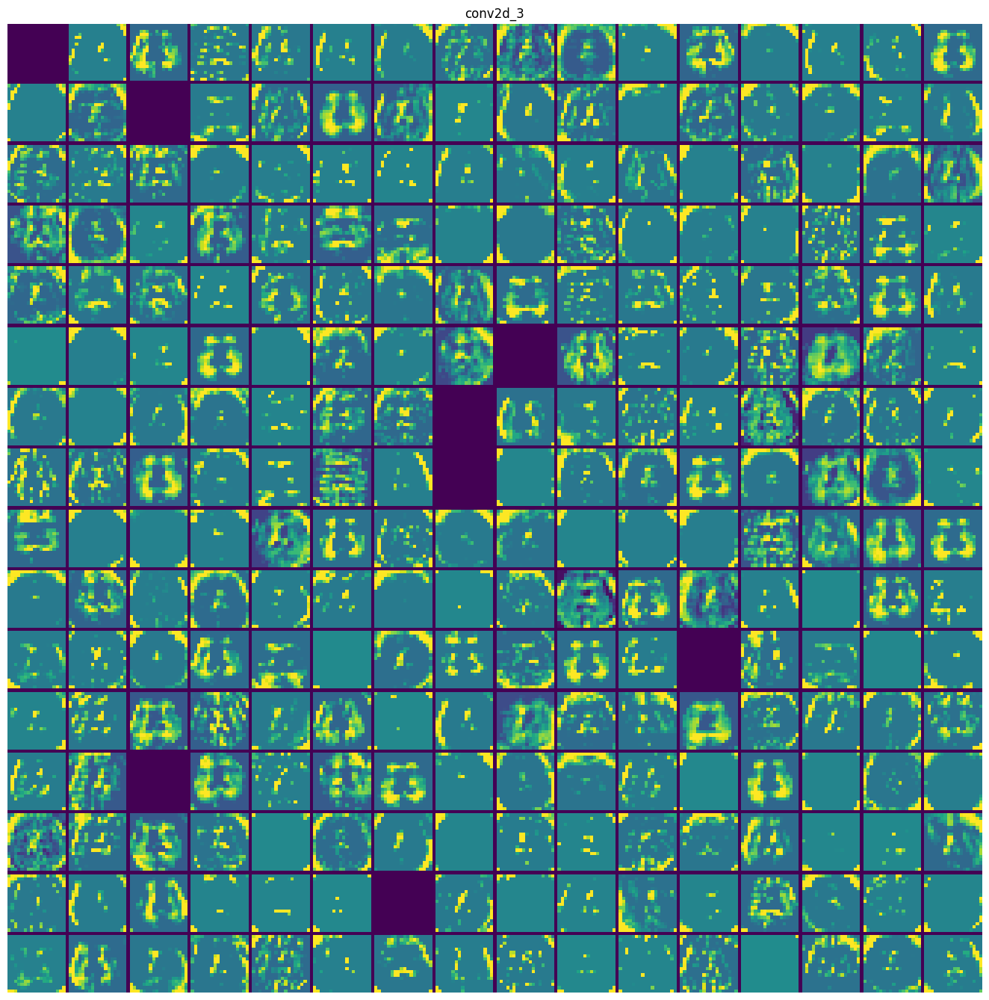

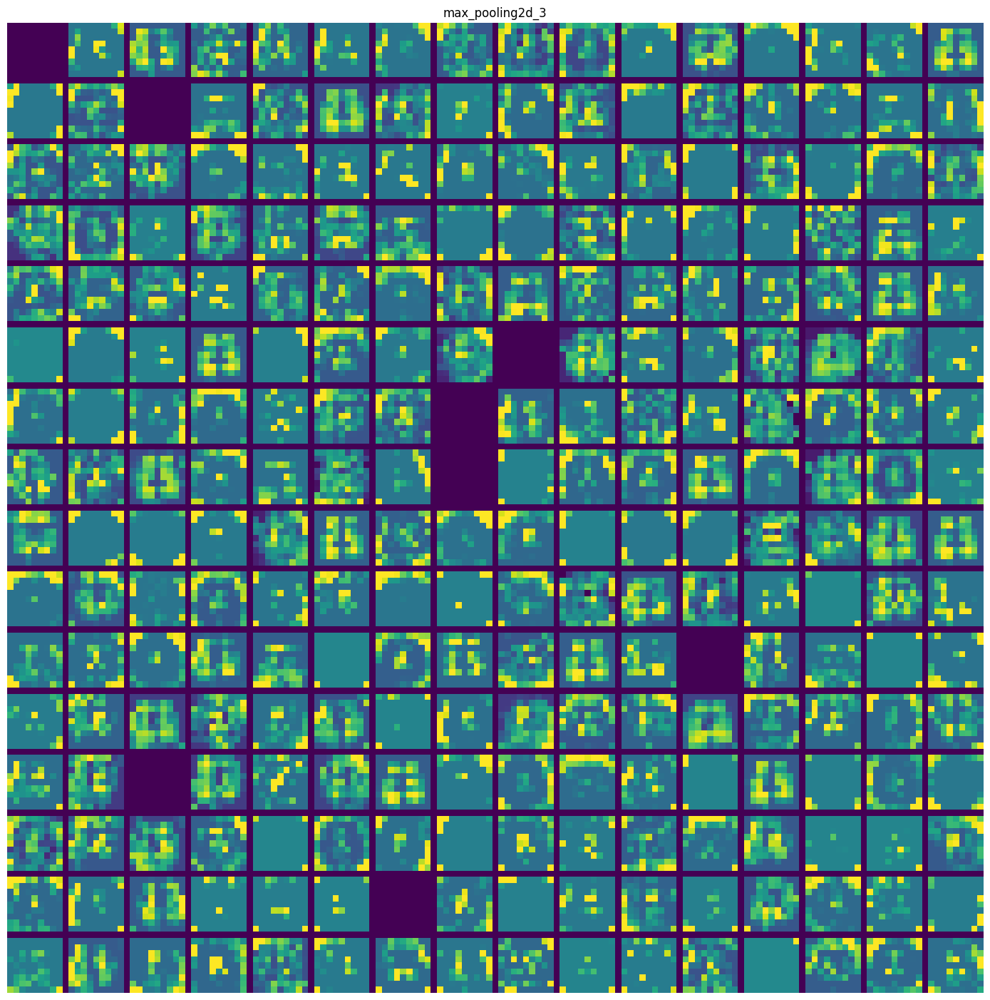

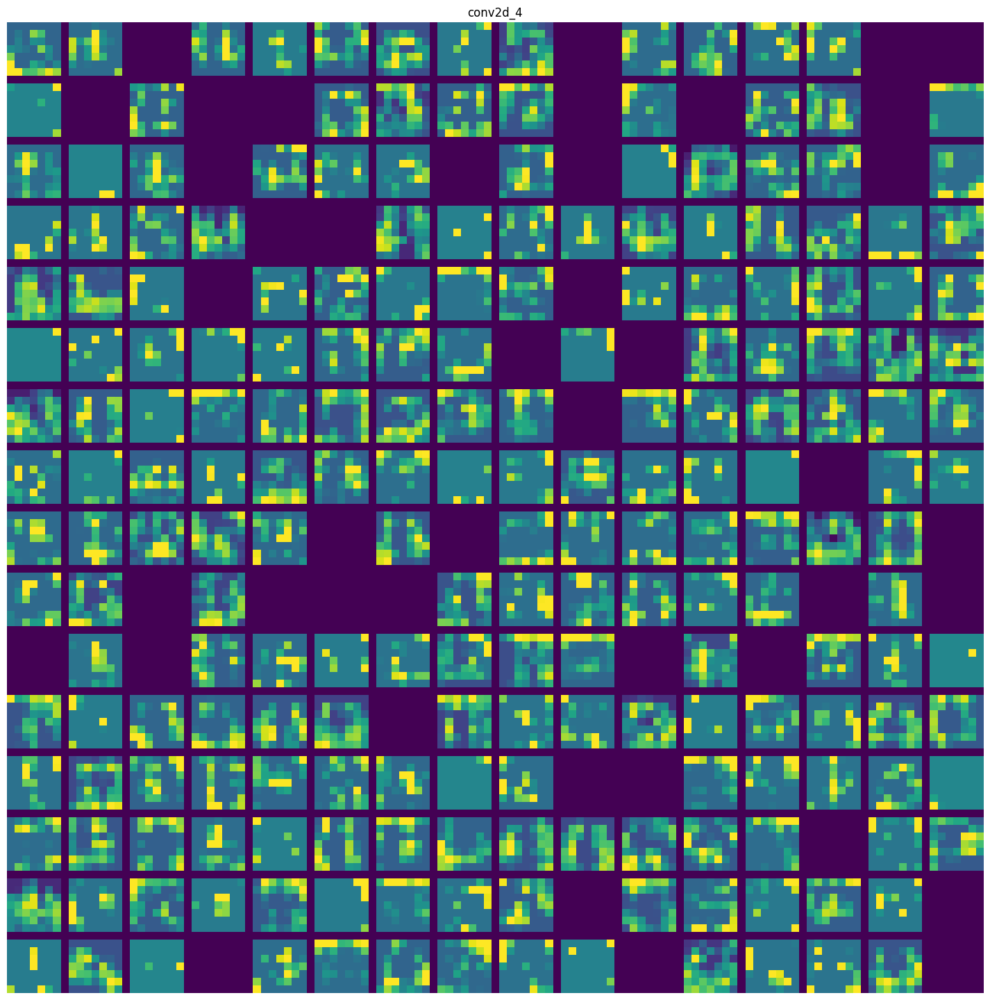

In [ ]:
images_per_row = 16
for layer_name, layer_activation in zip(layer_names, activations):
    n_features = layer_activation.shape[-1]
    size = layer_activation.shape[1]
    n_cols = n_features // images_per_row
    display_grid = np.zeros(((size + 1) * n_cols - 1,
                             images_per_row * (size + 1) - 1))
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_index = col * images_per_row + row
            channel_image = layer_activation[0, :, :, channel_index].copy()
            if channel_image.sum() != 0:
                channel_image -= channel_image.mean()
                channel_image /= channel_image.std()
                channel_image *= 64
                channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype("uint8")
            display_grid[
                col * (size + 1): (col + 1) * size + col,
                row * (size + 1) : (row + 1) * size + row] = channel_image
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.axis("off")
    plt.imshow(display_grid, aspect="auto", cmap="viridis")

Reference:

Deep Learning with Python - Manning Publications (2021) - François Chollet